# Walmart Sales analysis 
    -- Descriptive Analysis 
        -- level 1
    

In [1]:
#Loading key libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
sns.set(color_codes = True)

## train.csv
    fields: 
            -- Store: 45 stores
            -- Dept: 81 depts (1-99)
            -- Date: 143 weeks
            -- Weekly_Sales: also contains negative values
            -- IsHoliday:
    
    shape:
              (421570, 5)

In [3]:
path = 'data/train.csv'

In [4]:
df = pd.read_csv(path)

In [5]:
df.shape

(421570, 5)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [8]:
df['bin'] = list(map(lambda x: 'holiday' if x else 'not holiday', df.IsHoliday))

In [9]:
df.Date = df.Date.apply(pd.Timestamp)

In [7]:
df.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


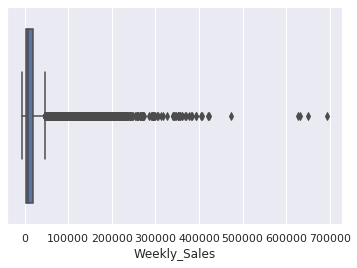

In [17]:
sns.boxplot(df.Weekly_Sales);

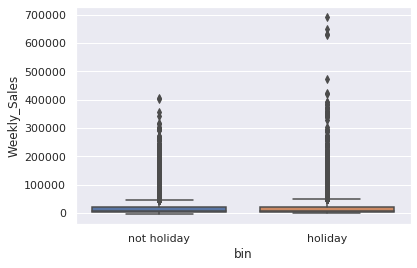

In [20]:
sns.boxplot(x = 'bin', y = 'Weekly_Sales', data = df);

In [30]:
a = np.sort(df.Dept.unique())

In [22]:
arr = np.arange(1, 100, 1)

In [33]:
# missing depts in the dataset
for val in arr:
    if val not in a:
        print(val)

15
53
57
61
62
63
64
66
68
69
70
73
75
76
84
86
88
89


## Impact of Holidays

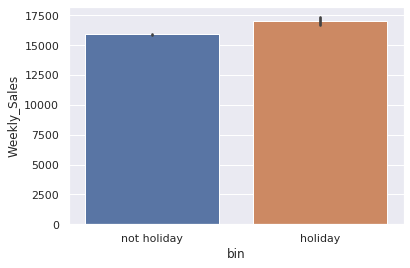

In [34]:
sns.barplot(x = 'bin', y = 'Weekly_Sales', data = df);

In [40]:
def my_estimator(x):
    return np.sum(x)

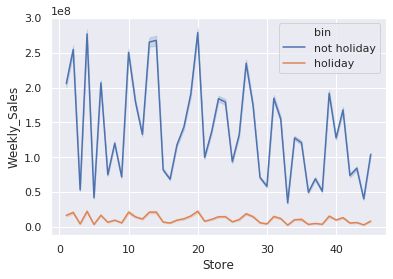

In [41]:
sns.lineplot(x = 'Store', y = 'Weekly_Sales', data = df, hue = 'bin', estimator = my_estimator);

In [69]:
h = pd.value_counts(df.bin)

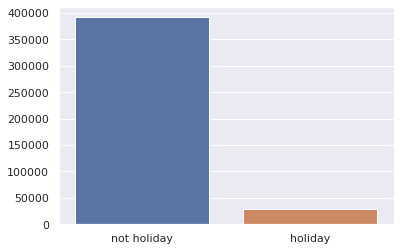

In [72]:
sns.barplot(x = h.index, y = h.values);

In [86]:
tb = pd.crosstab(index= df.Store, columns = df.bin)

In [102]:
tb['tot'] = np.sum(tb, axis = 1)

In [103]:
tb.sample(3)

bin,holiday,not holiday,tot
Store,,,
11,707,9355,10062
34,715,9509,10224
10,724,9591,10315


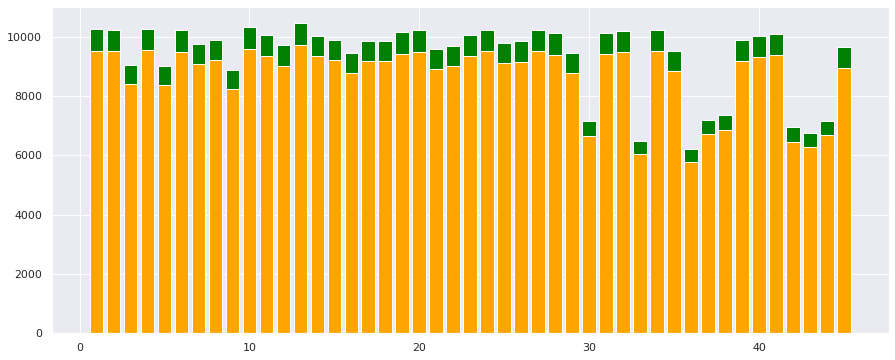

In [101]:
fig = plt.gcf()
fig.set_size_inches(15,6)
plt.bar(tb.index, tb['not holiday'], color = 'orange');
plt.bar(tb.index, tb.holiday, bottom = tb['not holiday'], color = 'green');

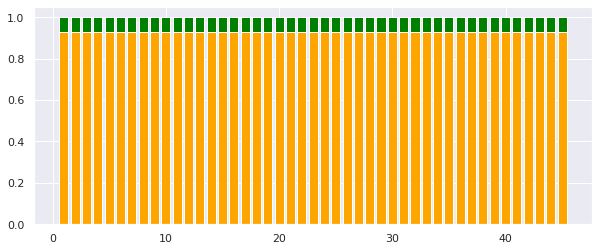

In [109]:
#relative count of holidays
fig = plt.gcf()
fig.set_size_inches(10,4)
plt.bar(tb.index, tb['not holiday']/tb.tot, color = 'orange');
plt.bar(tb.index, tb.holiday/tb.tot, bottom = tb['not holiday']/tb.tot, color = 'green');

In [115]:
np.mean(tb.holiday/tb.tot)

0.07032584543218544

In [110]:
tb_ = pd.crosstab(index = df.Store, columns = df.bin, values = df.Weekly_Sales, aggfunc = np.sum)

In [112]:
tb_['tot'] = tb_.sum(axis =1)

In [113]:
tb_.sample(3)

bin,holiday,not holiday,tot
Store,,,
17,9797969.71,1.179842e+08,1.277821e+08
13,21130438.06,2.653873e+08,2.865177e+08
41,13349478.56,1.679925e+08,1.813419e+08


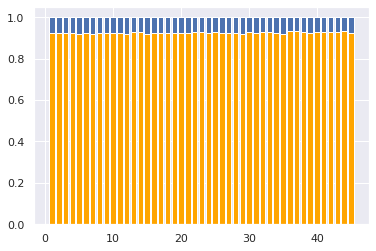

In [114]:
fig = plt.gcf()
plt.bar(tb_.index, height = tb_['not holiday']/tb_.tot, color = 'orange');
plt.bar(tb_.index, height = tb_.holiday/tb_.tot, bottom = tb_['not holiday']/tb_.tot);

In [116]:
m = np.mean(tb_.holiday/tb_.tot)
var = np.var(tb_.holiday/tb_.tot)
print('fraction of holiday sales across stores: mean {0:.3f}\tvar{1}'.format(m, var))

fraction of holiday sales across stores: mean 0.075	var1.0144687022978858e-05


## Trend across weeks

In [ ]:
tbd = pd.crosstab(index = df.Date, columns = df.Store, values = df.Weekly_Sales, aggfunc = np.sum)

In [10]:
tbd.sample(3)

Store,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,42,43,44,45
Date,,,,,,,,,,,,,,,,,,,,,
2011-04-08,1614259.35,1847552.61,384075.31,2074953.46,307333.62,1534594.00,500552.16,949825.83,561625.92,1870720.73,...,428727.61,543703.16,392152.30,1350646.16,947753.32,1206252.12,620087.35,650418.75,292498.61,750182.71
2011-02-18,1686842.78,2080884.82,432782.10,2316495.56,356622.61,1572117.54,572387.47,1065108.64,610985.56,2106934.55,...,427175.03,536840.69,364606.70,1335233.74,968694.45,1203399.64,556485.10,626627.77,280785.76,802253.41
2010-10-01,1453329.50,1827440.43,358784.10,1842821.02,283178.12,1328468.89,448998.73,804105.49,495692.19,1645892.97,...,422169.47,529877.93,360256.58,1219583.91,891152.33,1109216.35,481523.93,657108.77,300152.45,690007.76


In [128]:
stores = np.random.choice(np.arange(1, 45, 1), size = 5)
stores

array([19,  2, 17, 29,  8])

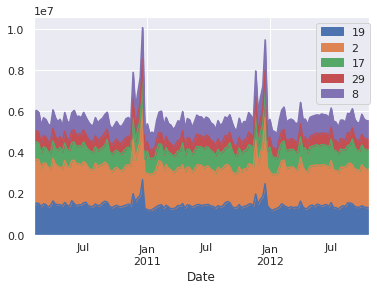

In [129]:
tbd.loc[:, stores].plot.area();
plt.legend(bbox_to_anchor = (1.02, 1))

In [130]:
#variation across all stores
tbd['tot'] = tbd.sum(axis = 1)

In [132]:
tbd['tot'].sample(3)

Date
2010-02-26    43968571.13
2012-06-29    46597112.12
2010-02-05    49750740.50
Name: tot, dtype: float64

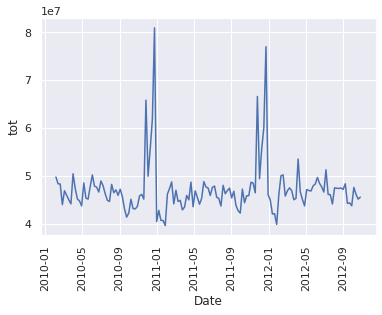

In [135]:
sns.lineplot(x = tbd.index, y = tbd.tot);
plt.xticks(rotation = 90);

### styling

In [62]:
index = ['2010-12-24','2010-12-31','2011-12-23', '2011-12-30']
index = list(map(pd.Timestamp, index))

In [42]:
tbd.shape

(143, 45)

In [43]:
tbd.style.highlight_max(color = 'red').highlight_min(color = 'blue')

Store,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-05 00:00:00,1643690.900000,2136989.460000,461622.220000,2135143.870000,317173.100000,1652635.100000,496725.440000,1004137.090000,549505.550000,2193048.750000,1528008.640000,1100046.370000,1967220.530000,2623469.950000,652122.440000,477409.300000,789036.020000,1205307.500000,1507637.170000,2401395.470000,798593.880000,1033017.370000,1364721.580000,1388725.630000,677231.630000,1034119.210000,1874289.790000,1672352.290000,538634.460000,465108.520000,1469252.050000,1087616.190000,274593.430000,956228.960000,1230613.500000,467546.740000,536006.730000,358496.140000,1230596.800000,1001943.800000,1086533.180000,543384.010000,647029.280000,281090.950000,890689.510000
2010-02-12 00:00:00,1641957.440000,2137809.500000,420728.960000,2188307.390000,311825.700000,1606283.860000,524104.920000,994801.400000,552677.480000,2176028.520000,1574684.080000,1117863.330000,2030933.460000,1704218.840000,682447.100000,472044.280000,841951.910000,1187880.700000,1536549.950000,2109107.900000,809321.440000,1022571.250000,1380892.080000,1414107.100000,583364.020000,1015684.090000,1745362.720000,1558968.490000,529672.950000,497374.570000,1543947.230000,1123566.120000,294882.830000,994610.990000,1168815.310000,469563.700000,529852.700000,342214.900000,1266229.070000,955338.290000,1075656.340000,575709.960000,682918.990000,286857.130000,656988.640000
2010-02-19 00:00:00,1611968.170000,2124451.540000,421642.190000,2049860.260000,303447.570000,1567138.070000,506760.540000,963960.370000,511327.900000,2113432.580000,1503298.700000,1095421.650000,1970274.640000,2204556.700000,660838.750000,469868.700000,800714.000000,1150663.420000,1515976.110000,2161549.760000,867283.250000,988467.610000,1319588.040000,1385362.490000,676260.670000,999348.550000,1945070.330000,1491300.420000,542399.070000,463513.260000,1473386.750000,1082559.060000,296850.830000,983963.070000,1270658.640000,470281.030000,510382.500000,327237.920000,1230591.970000,916289.200000,1052034.740000,508794.870000,658997.550000,267956.300000,841264.040000
2010-02-26 00:00:00,1409727.590000,1865097.270000,407204.860000,1925728.840000,270281.630000,1432953.210000,496083.240000,847592.110000,473773.270000,2006774.960000,1336404.650000,1048617.170000,1817850.320000,2095591.630000,564883.200000,443242.170000,749549.550000,1068157.450000,1373270.060000,1898193.950000,749597.240000,899761.480000,1198709.650000,1158722.740000,628516.570000,855385.010000,1390934.270000,1542173.330000,488417.610000,472330.710000,1344354.410000,1053247.100000,284052.770000,905756.130000,1020651.740000,447519.440000,513615.820000,334222.730000,1168582.020000,863917.410000,991941.730000,491510.580000,618702.790000,273079.070000,741891.650000
2010-03-05 00:00:00,1554806.680000,1991013.130000,415202.040000,1971057.440000,288855.710000,1601348.820000,491419.550000,881503.950000,507297.880000,1987090.090000,1426622.650000,1077018.270000,1939980.430000,2237544.750000,605325.430000,444181.850000,783300.050000,1179738.500000,1495844.570000,2119213.720000,747444.320000,1009201.240000,1311175.930000,1412387.370000,665750.060000,1005669.580000,1313729.720000,1608435.450000,535087.910000,472591.070000,1384870.510000,1066566.740000,291484.890000,918295.790000,1162610.270000,480203.430000,519255.680000,372239.890000,1266254.210000,990152.280000,1063557.490000,554972.420000,658600.050000,284617.270000,777951.220000
2010-03-12 00:00:00,1439541.590000,1990483.780000,384200.690000,1894324.090000,297293.590000,1558621.360000,480452.100000,860336.160000,494145.800000,1941346.130000,1331883.160000,985594.230000,1840686.940000,2156035.060000,604173.590000,445393.740000,763961.820000,1138800.320000,1467889.200000,2010974.840000,712312.890000,967187.370000,1408082.960000,1309340.160000,660619.990000,963382.090000,1925113.120000,1326877.110000,519042.490000,468189.930000,1

In [58]:
tbd.style.background_gradient(cmap = 'Oranges', axis = 1)

In [66]:
tbd.loc[:, [42,43]].style.highlight_max(color = 'red').highlight_min(color = 'green')

Store,42,43
Date,,
2010-02-05 00:00:00,543384.010000,647029.280000
2010-02-12 00:00:00,575709.960000,682918.990000
2010-02-19 00:00:00,508794.870000,658997.550000
2010-02-26 00:00:00,491510.580000,618702.790000
2010-03-05 00:00:00,554972.420000,658600.050000
2010-03-12 00:00:00,588363.620000,645386.940000
2010-03-19 00:00:00,519914.100000,668098.490000
2010-03-26 00:00:00,478021.680000,623097.930000
2010-04-02 00:00:00,505907.410000,650102.800000


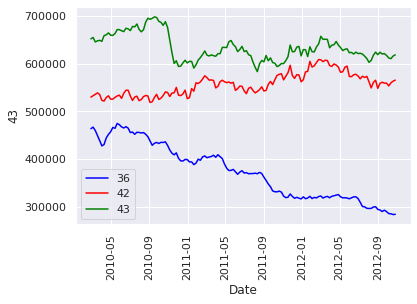

In [72]:
t = tbd.loc[:, [36,42,43]]
t = t.rolling(4).mean()
sns.lineplot(t.index, t.loc[:,36], color = 'blue');
sns.lineplot(t.index, t.loc[:,42], color = 'red');
sns.lineplot(t.index, t.loc[:,43], color = 'green');
plt.xticks(rotation = 90);
plt.legend(['36','42','43']);

In [64]:
store = [5,33,35,36,38,42,43]
tbd.loc[index, store].style.background_gradient(cmap = 'Greens')

Store,5,33,35,36,38,42,43
Date,,,,,,,
2010-12-24 00:00:00,466010.250000,249246.800000,1779236.540000,422093.590000,369106.720000,555075.270000,656637.630000
2010-12-31 00:00:00,298180.180000,219804.850000,576332.050000,359310.650000,303908.810000,428953.600000,534740.300000
2011-12-23 00:00:00,458562.240000,256235.190000,1550214.020000,325262.460000,419717.410000,575676.130000,676290.460000
2011-12-30 00:00:00,349624.880000,215359.210000,904650.550000,287425.220000,342667.350000,454412.280000,505405.850000


In [57]:
tbd.loc[:, store].describe().style.background_gradient(cmap = 'Oranges', axis = 1)

Store,5,33,35,36,38,42,43
count,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000
mean,318011.810490,259861.692028,919724.979580,373511.992797,385731.653287,556403.863147,633324.723147
std,37737.965745,24132.927322,211243.457791,60725.173579,42768.169450,50262.925530,40598.413260
min,260636.710000,209986.250000,576332.050000,270677.980000,303908.810000,428953.600000,505405.850000
25%,294696.000000,242491.545000,801523.225000,320540.030000,350365.655000,515975.955000,605517.605000
50%,310338.170000,258427.390000,849779.140000,373267.580000,380870.090000,556046.120000,634815.100000
75%,329860.580000,275235.705000,1003065.690000,426489.915000,414198.140000,593055.140000,659814.800000
max,507900.070000,331173.510000,1781866.980000,489372.020000,499267.660000,674919.450000,725043.040000


In [45]:
month = [9,10,11,12]
tb_ = tbd[tbd.index.month.isin(month)]

In [46]:
tb_.shape

(44, 45)

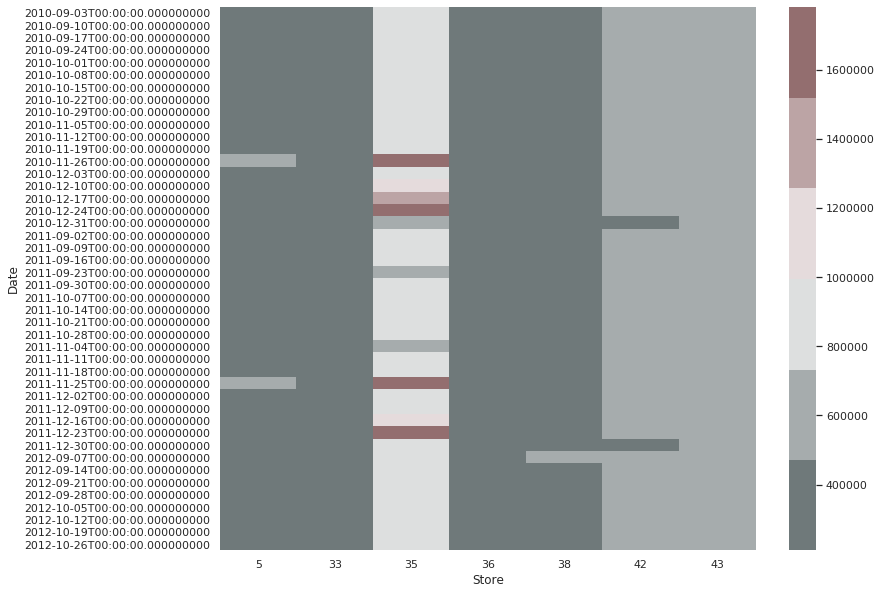

In [47]:
my_cmap = sns.diverging_palette(50, 15, 15)
fig = plt.gcf()
fig.set_size_inches(12,10)
sns.heatmap(tb_.loc[:,store], cmap = my_cmap);

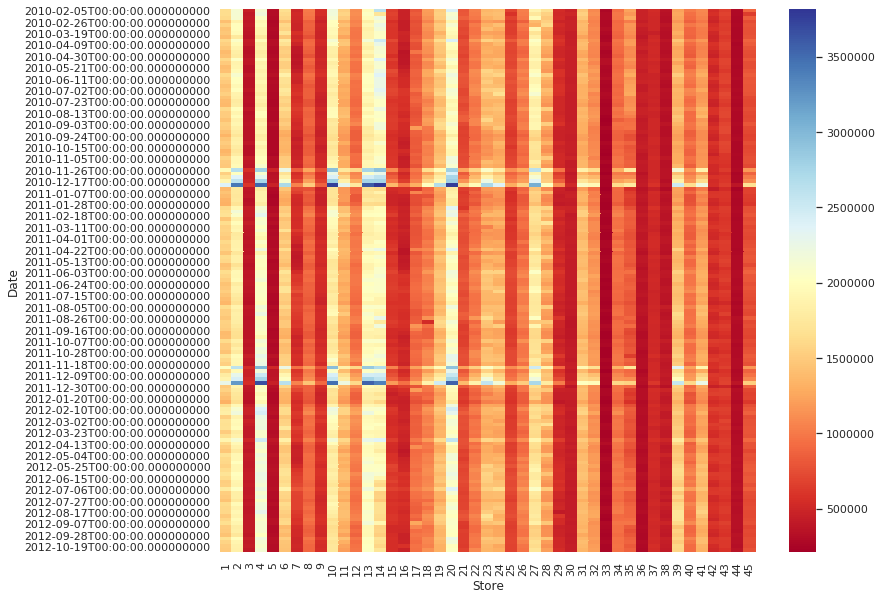

In [81]:
fig = plt.gcf()
fig.set_size_inches(12,10)
sns.heatmap(tbd, cmap = 'RdYlBu');

### stores with maximum sales throughout

In [85]:
store_max = [2,4,10,13,14,20]
store_min = [3,5,16,30,42,44]
store = []
store.extend(store_max)
store.extend(store_min)
y = tbd.loc[:, store]
y = y.rolling(4).mean()

In [94]:
cmap = plt.get_cmap('tab10')
my_colors = cmap(np.arange(len(store_min)))

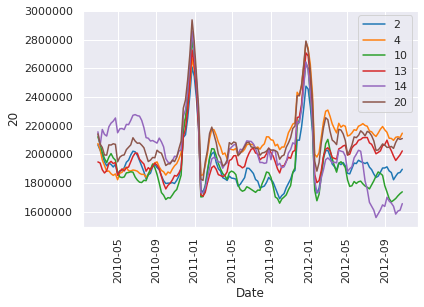

In [92]:
fig = plt.gcf()
for i,val in enumerate(store_max):
    sns.lineplot(y.index, y.loc[:,val], color = my_colors[i]);
plt.xticks(rotation = 90)
plt.legend(store_max);

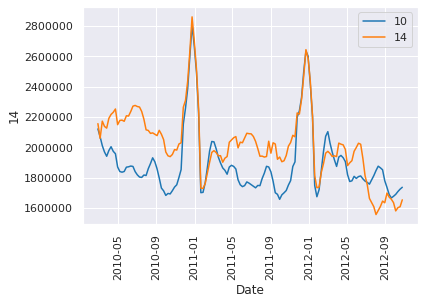

In [93]:
fig = plt.gcf()
st = [10,14]
for i,val in enumerate(st):
    sns.lineplot(y.index, y.loc[:,val], color = my_colors[i]);
plt.xticks(rotation = 90)
plt.legend(st);

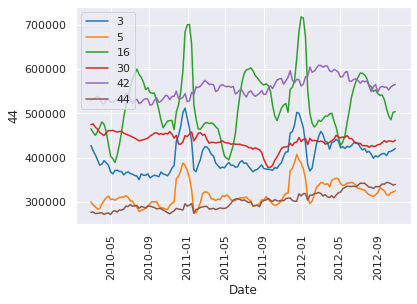

In [95]:
fig = plt.gcf()
for i,val in enumerate(store_min):
    sns.lineplot(y.index, y.loc[:,val], color = my_colors[i]);
plt.xticks(rotation = 90)
plt.legend(store_min);

### weekly trends across depts

In [9]:
tbs = pd.crosstab(index = df.Date, columns = df.Dept, values = df.Weekly_Sales, aggfunc = np.sum)

In [60]:
tbs.shape

(143, 81)

In [61]:
tbs.style.highlight_max(color = 'red').highlight_min(color = 'green')

Dept,1,2,3,4,5,6,7,8,9,10,11,12,13,14,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,54,55,56,58,59,60,65,67,71,72,74,77,78,79,80,81,82,83,85,87,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-05 00:00:00,881833.410000,1997831.890000,484368.900000,1205801.770000,1116952.540000,206793.280000,764967.960000,1527438.170000,535727.560000,773682.900000,651387.150000,168802.280000,1522916.770000,744664.420000,201198.580000,558684.580000,166777.430000,56493.120000,265131.960000,257986.690000,513801.980000,875453.870000,242250.330000,365598.140000,348794.250000,84463.380000,36758.580000,230289.150000,183381.810000,99402.340000,332272.160000,267483.500000,635170.080000,96689.310000,31678.900000,66989.640000,3022955.050000,nan,2238389.820000,31182.710000,204211.200000,nan,189772.100000,411.020000,854943.680000,202.000000,15809.960000,285793.000000,29780.000000,664.910000,99508.870000,9560.850000,555023.080000,39529.130000,155247.250000,34792.870000,14077.400000,41057.250000,365778.020000,345617.270000,3372690.550000,678429.570000,nan,123.000000,1228686.530000,521864.340000,747310.800000,577369.200000,166944.950000,87214.760000,609066.670000,2199107.520000,1755822.240000,3781162.870000,1165221.800000,1301383.110000,3170529.930000,404386.060000,656075.000000,293125.350000,0.030000
2010-02-12 00:00:00,1457182.400000,1839217.770000,429341.020000,1075081.620000,1148132.320000,252086.570000,781977.020000,1375373.290000,562174.720000,762338.460000,591729.990000,152456.100000,1327494.630000,714470.520000,252750.170000,536295.550000,512810.690000,52834.440000,241003.170000,252303.110000,501304.720000,895426.520000,244350.500000,394240.320000,340097.480000,78835.770000,33619.890000,251032.740000,173675.480000,98943.690000,428886.410000,257678.460000,611157.260000,86259.540000,33114.340000,62013.880000,2686547.520000,nan,2037203.290000,37746.190000,184438.950000,0.250000,191664.180000,539.470000,805561.880000,1224.970000,12485.930000,291082.490000,30604.000000,885.670000,96251.150000,11502.940000,620547.990000,57485.760000,125943.610000,32788.750000,13909.200000,39799.360000,663589.770000,316181.960000,3102766.890000,607921.770000,nan,93.000000,1082770.340000,516818.050000,680040.170000,591428.530000,171428.950000,88086.990000,541000.950000,2031157.150000,1603013.190000,3443837.300000,1077422.700000,1317069.860000,2976149.310000,448865.030000,613648.810000,377482.790000,0.010000
2010-02-19 00:00:00,1118257.360000,1961685.930000,410399.140000,1113781.740000,1110717.470000,258741.790000,843175.360000,1414318.210000,587592.220000,780288.540000,582631.200000,165622.650000,1412757.980000,727615.370000,287206.070000,561289.700000,391272.260000,51199.740000,257127.250000,253108.950000,529914.970000,920194.770000,231171.220000,378667.410000,353759.710000,77712.370000,36537.710000,265316.730000,190811.640000,96282.340000,538020.590000,248490.520000,661952.350000,94759.840000,37938.000000,66267.420000,2712708.650000,0.780000,2163829.950000,38744.400000,207985.070000,nan,173019.500000,459.470000,873163.760000,584.970000,12642.000000,337219.320000,36660.000000,766.890000,105655.150000,15599.470000,666698.060000,77826.840000,119888.820000,37329.660000,12537.400000,42908.440000,531250.850000,323734.010000,3034799.980000,661960.780000,nan,41.000000,1089782.130000,476861.180000,657129.600000,599874.140000,203166.200000,88368.190000,518886.950000,1976215.640000,1546117.670000,3312991.710000,1005051.420000,1513229.840000,2814037.790000,395923.920000,569748.820000,304997.850000,8.990000
2010-02-26 00:00:00,681391.580000,1859531.580000,415060.220000,1075834.390000,855568.940000,212400.430000,719317.340000,1367537.170000,561960.460000,776371.880000,564183.230000,175201.560000,1382123.980000,681409.550000,290113.930000,529639.030000,31394.440000,51123.830000,246414.360000,241662.320000,461427.840000,804817.940000,218321.380000,35370

In [35]:
tbs.drop([39,43,77], axis = 1, inplace = True)

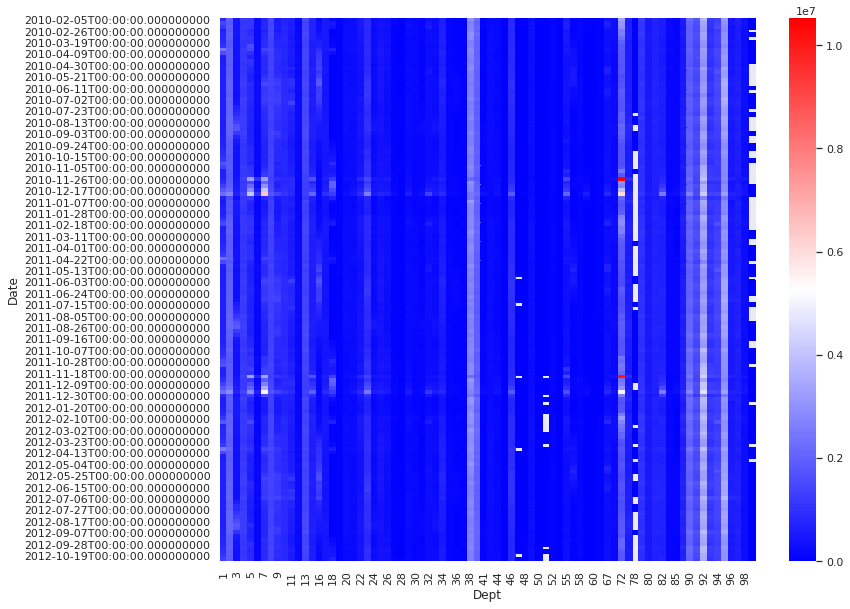

In [36]:
fig = plt.gcf()
fig.set_size_inches(12,10)
sns.heatmap(tbs, cmap = 'bwr');

In [30]:
tbs.columns[tbs.count()/tbs.shape[0] < 0.5]

Int64Index([39, 43, 77], dtype='int64', name='Dept')

In [34]:
tbs.columns[tbs.count()/tbs.shape[0] == 1]

Int64Index([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
            19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
            36, 37, 38, 40, 41, 42, 44, 45, 46, 48, 49, 50, 52, 54, 55, 56, 58,
            59, 60, 65, 67, 71, 72, 74, 79, 80, 81, 82, 83, 85, 87, 90, 91, 92,
            93, 94, 95, 96, 97, 98],
           dtype='int64', name='Dept')

In [37]:
depts = [38,72,92,95]
cmap = plt.get_cmap('Set1')
my_colors = cmap(np.arange(len(depts)))

In [39]:
tb = tbs.loc[:, depts]
tb = tb.rolling(4).mean()

In [40]:
tb.shape

(143, 4)

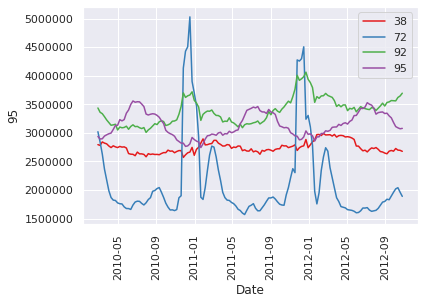

In [43]:
fig = plt.gcf()
for i, val in enumerate(depts):
    sns.lineplot(tb.index, tb.loc[:, val], color = my_colors[i]);
plt.legend(depts);
plt.xticks(rotation = 90);

In [93]:
depts = [9,12,3,56]

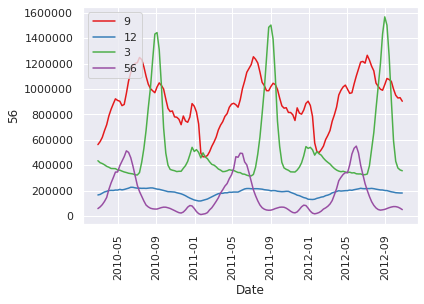

In [94]:
fig = plt.gcf()
for i, val in enumerate(depts):
    sns.lineplot(tbs.index, tbs.loc[:,val], color = my_colors[i])
plt.xticks(rotation = 90)
plt.legend(depts);

## Weekly Sales for each dept across each store

In [14]:
# I want to have sales across depts for each store with index being date
t = pd.pivot_table(df, values = "Weekly_Sales", index = ["Date","Store"], columns = "Dept", aggfunc = np.sum)

In [15]:
t.sample(3)

,Dept,1,2,3,4,5,6,7,8,9,10,...,90,91,92,93,94,95,96,97,98,99
Date,Store,,,,,,,,,,,,,,,,,,,,,
2012-02-10,12,24137.25,88331.55,16727.66,28962.63,37930.68,7242.24,27866.54,46171.19,17028.38,21392.56,...,13759.98,7724.97,31571.06,898.14,21.50,41574.67,NaN,2616.62,1317.14,NaN
2010-06-11,43,6215.42,21729.00,571.21,18241.74,34.96,70.38,832.14,13666.04,283.13,514.58,...,64590.40,46400.17,89238.62,39393.42,59571.65,88591.36,30300.22,22734.60,9514.43,NaN
2010-10-08,12,15827.89,72622.44,12937.75,25347.19,23313.94,6643.49,23631.11,41841.52,17090.89,16219.91,...,9867.24,6393.35,24449.52,370.98,NaN,38926.23,NaN,2465.55,636.52,NaN


In [16]:
t.shape

(6435, 81)

In [71]:
def nan_color_red(x):
    color = 'red' if x<0 else 'black'
    return 'color:'+color

In [81]:
t.loc[:, [19,37,39,45,45,47]] #.style.highlight_null()

Dept                   19       37  39     45     45    47
Date       Store                                          
2010-02-05 1      1947.05  3438.16 NaN  37.44  37.44  70.0
           2      4891.96  4961.19 NaN  27.50  27.50   NaN
           3       764.14      NaN NaN   4.50   4.50  10.0
           4      4656.70  5141.83 NaN   7.50   7.50   NaN
           5        63.95      NaN NaN    NaN    NaN   NaN
...                   ...      ...  ..    ...    ...   ...
2012-10-26 41     2232.49      NaN NaN  41.82  41.82   NaN
           42         NaN      NaN NaN    NaN    NaN   NaN
           43         NaN      NaN NaN    NaN    NaN   NaN
           44         NaN      NaN NaN    NaN    NaN   NaN
           45     1350.87      NaN NaN    NaN    NaN   NaN

[6435 rows x 6 columns]

In [79]:
t[t.isna().all(axis = 1)]

,Dept,1,2,3,4,5,6,7,8,9,10,...,90,91,92,93,94,95,96,97,98,99
Date,Store,,,,,,,,,,,,,,,,,,,,,


In [63]:
if bool(t.xs(1, level =1).iloc[1,45]):
    print('hello')

hello


In [28]:
store = np.random.choice(np.arange(1, 46, 1), 1)
print(store)
t.xs(store[0], level = 1).style.background_gradient(cmap = 'Oranges', axis = 1)

[17]


/usr/anaconda/lib/python3.7/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


In [23]:
t.xs(14, level = 1) #.style.highlight_max(color = 'red').highlight_min(color = 'green')

Dept,1,2,3,4,5,6,7,8,9,10,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2010-02-05,32842.31,87917.02,18487.90,66912.92,48040.92,8992.23,34413.92,70627.96,12532.12,22663.72,...,166263.81,162497.78,293966.05,103827.72,90943.29,213042.66,NaN,45017.96,24273.74,NaN
2010-02-12,39972.64,55899.41,10969.47,37079.75,41204.07,6629.72,28485.69,42407.92,10420.32,18833.32,...,89460.26,78058.28,151901.21,49584.74,54100.75,114381.30,NaN,22098.67,18099.10,NaN
2010-02-19,35163.18,83031.73,15829.84,53388.87,47869.08,11468.55,39254.24,57163.76,13862.97,19859.69,...,110790.79,99812.11,192282.19,57760.33,84708.63,141663.36,NaN,24556.94,20631.05,NaN
2010-02-26,21433.52,78941.75,16137.38,51880.31,33001.67,6750.99,30429.39,54874.90,15264.96,19231.38,...,122369.17,110977.72,205250.96,67099.37,72262.37,151818.16,NaN,29080.99,18615.95,NaN
2010-03-05,26460.12,87081.07,17385.89,53594.98,37936.00,6277.57,36133.89,60248.28,15502.71,21065.49,...,116356.84,116031.38,214383.07,67225.51,74841.45,159118.95,NaN,29741.30,18598.71,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,20221.90,57432.11,9180.03,38441.15,25805.48,2349.36,39889.80,42001.27,14015.99,13125.86,...,85001.13,66414.24,139707.80,42750.73,47503.45,105376.06,NaN,18503.90,14584.25,NaN
2012-10-05,23547.40,65345.41,9733.90,43745.72,24913.66,3184.51,36039.57,46769.95,14718.35,13301.10,...,95863.28,81781.84,169519.23,53215.31,51539.81,118491.68,NaN,23905.59,13642.74,750.0
2012-10-12,28571.55,59971.30,8933.26,40119.53,25036.82,3046.77,39123.74,45484.78,15415.84,16705.32,...,90327.67,76052.46,156174.21,48564.40,50891.80,109851.09,3.0,19624.94,14068.34,90.0


In [35]:
t.describe().style.background_gradient(cmap = 'Blues', axis = 1)

Dept,1,2,3,4,5,6,7,8,9,10,11,12,13,14,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,54,55,56,58,59,60,65,67,71,72,74,77,78,79,80,81,82,83,85,87,90,91,92,93,94,95,96,97,98,99
count,6435.000000,6435.000000,6435.000000,6435.000000,6347.000000,5986.000000,6435.000000,6435.000000,6354.000000,6435.000000,6434.000000,6409.000000,6435.000000,6435.000000,6435.000000,6412.000000,5029.000000,4119.000000,6032.000000,6435.000000,5543.000000,5774.000000,5406.000000,6354.000000,5739.000000,5619.000000,6124.000000,5308.000000,5291.000000,6067.000000,5956.000000,5390.000000,5326.000000,5297.000000,5295.000000,2577.000000,6435.000000,16.000000,6435.000000,5393.000000,6401.000000,12.000000,5471.000000,1936.000000,6435.000000,646.000000,1742.000000,4482.000000,1562.000000,1394.000000,6268.000000,4767.000000,5596.000000,5872.000000,4390.000000,6106.000000,5772.000000,143.000000,6435.000000,5309.000000,6046.000000,6430.000000,150.000000,235.000000,6435.000000,5891.000000,6435.000000,6435.000000,5908.000000,6055.000000,6391.000000,6435.000000,6435.000000,6435.000000,5913.000000,5685.000000,6435.000000,4854.000000,6278.000000,5836.000000,862.000000
mean,19213.485088,43607.020113,11793.698516,25974.630238,21365.583515,4747.856188,24161.237413,30191.263517,20206.681878,18321.272351,14505.638231,4175.397021,30663.802634,14870.966037,14245.638270,10187.120498,7336.943539,1654.815030,5528.787319,4982.850828,10774.509717,23931.473983,6353.604562,8988.230818,7649.417947,1583.437727,618.085116,5653.655317,4118.197208,2339.440287,6833.270787,6471.979579,15625.915402,2921.044946,2022.571061,3111.076193,61090.619568,11.123750,44900.702727,1965.559998,5189.703417,1.193333,4651.729658,23.211586,19944.741483,-7.682554,1344.893576,8159.951296,2658.897010,21.931729,1928.356252,108.305985,10716.664644,3833.706211,3702.907419,694.463564,347.370229,45441.706224,7440.680292,5722.927649,50566.515417,13807.462764,328.961800,7.296638,21973.044932,12183.680224,15470.400825,15469.631753,3383.349838,2264.359407,13418.882117,45232.084488,33687.910758,75204.870531,27008.060746,33405.883963,69824.423080,15210.942761,14255.576919,6824.694889,415.487065
std,15102.373853,25176.756920,12790.994371,13261.140706,19988.452259,4446.426659,27985.082741,18189.717268,16695.725039,12992.485737,10315.627264,2846.746234,16237.526432,11596.030222,16043.051117,7430.506870,13837.756895,1446.235497,3860.051044,3258.083806,6675.714288,16035.204670,4475.810690,6367.828953,5179.650252,1167.135091,464.201770,3702.536937,2465.293234,2017.421849,5906.111943,4290.392671,8959.160834,1760.697261,1877.277483,887.650932,23966.913901,9.511561,21903.876911,2714.778091,3270.083119,1.027745,2584.659873,24.960376,12811.743799,307.882645,1243.525038,6683.465462,1758.141013,29.146545,1465.193895,145.515905,9188.797532,5978.350685,4308.689781,1991.364773,283.900968,7086.889697,5817.253170,3954.284421,44710.982652,10299.604773,343.471023,10.400545,13730.020122,10519.189985,9646.502306,10502.399054,2863.955889,1733.056632,11645.360696,32462.020077,26247.462296,49413.732570,22593.647749,25405.560190,38200.536452,11255.543496,10856.679936,5636.056533,1099.725277
min,711.110000,5453.180000,2.000000,4695.190000,-0.040000,-4988.940000,76.810000,2483.260000,-132.460000,2.460000,0.900000,-5.590000,5599.450000,410.470000,-771.900000,0.400000,-175.540000,-69.560000,0.000000,73.770000,-419.280000,-23.920000,-10.470000,-7.120000,-6.240000,-7.500000,-5.500000,3.490000,250.500000,-23.000000,-1321.480000,-11.970000,-9.880000,-17.470000,-117.000000,-2.500000,6199.580000,0.780000,4104.890000,-36.000000,4.170000,0.250000,-30.000000,-139.000000,1249.480000,-3924.000000,-543.000000,-326.610000,-79.000000,-176.400000,-1.840000,-465.080000,-59.960000,-103.060000,-50.000000,-55.460000,-7.500000,26643.970000,321.080000,-199.000000,-379.000000,-6.640000,-175.000000,-24.000000,3418.450000,-590.040000,859.500000,2179.660000,-5.480000,-0.290000,6.470000,461.700000,13.680000,4411.

## yearwise split

In [10]:
df['year'] = df.Date.dt.year
df['month'] = df.Date.dt.month

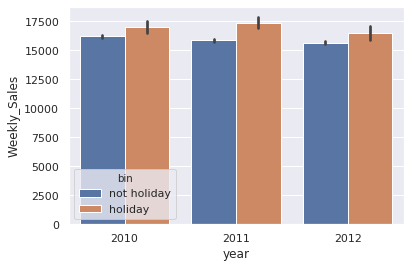

In [45]:
sns.barplot("year", "Weekly_Sales", data = df, hue = 'bin');

## Monthly trends across stores

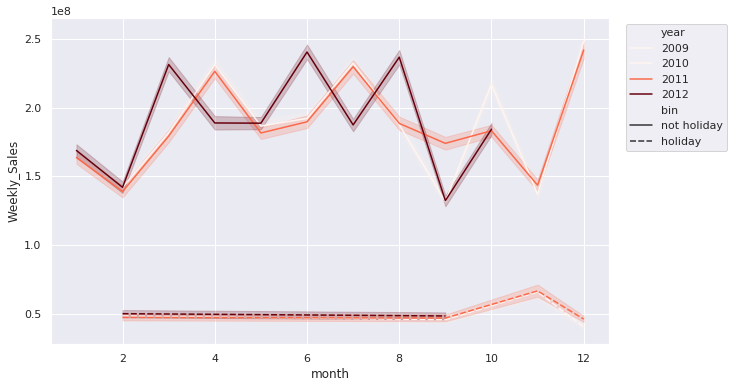

In [123]:
fig = plt.gcf()
fig.set_size_inches(10, 6)
sns.lineplot("month", "Weekly_Sales", data = df, style = "bin", hue = "year", palette = 'Blues', estimator = np.sum);
plt.legend(bbox_to_anchor = (1.02,1));

In [11]:
df.sample(3)

,Store,Dept,Date,Weekly_Sales,IsHoliday,bin,year,month
298231,31,33,2012-03-30,3738.58,False,not holiday,2012,3
264968,27,81,2010-08-13,32364.69,False,not holiday,2010,8
333819,35,24,2011-04-15,8289.43,False,not holiday,2011,4


In [16]:
df_mon = df.loc[:,["Store", "year", "month", "bin","Weekly_Sales"]]

In [14]:
df_mon.set_index(["year", "month"], inplace = True)

In [20]:
md = pd.crosstab(index = [df_mon.year,df_mon.month], columns = df_mon.Store, values = df_mon.Weekly_Sales, aggfunc = np.sum)

### 2010

In [42]:
# year 2010
x = md.xs(2010, level = 0)
x.style.background_gradient(cmap = 'Reds', axis = 1)

Store,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
month,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,6307344.100000,8264347.770000,1711198.230000,8299040.360000,1202728.000000,6259010.240000,2023674.140000,3810490.970000,2087284.200000,8489284.810000,5942396.070000,4361948.520000,7786278.950000,8627837.120000,2560291.490000,1862564.450000,3181251.480000,4612009.070000,5933433.290000,8570247.080000,3224795.810000,3943817.710000,5263911.350000,5346917.960000,2565372.890000,3904536.860000,6955657.110000,6264794.530000,2099124.090000,1898327.060000,5830940.440000,4346988.470000,1150379.860000,3840559.150000,4690739.190000,1854910.910000,2089857.750000,1362171.690000,4895999.860000,3737488.700000,4206165.990000,2119399.420000,2607648.610000,1108983.450000,3130833.840000
3,5871293.980000,7677765.600000,1534680.590000,7525350.190000,1141138.680000,6325062.470000,2061053.480000,3354290.230000,1972134.850000,7768843.740000,5368337.080000,4016316.650000,7542558.240000,8510195.380000,2395321.180000,1877060.140000,3092394.030000,4498750.380000,5723697.570000,7976779.940000,2873324.740000,3954608.820000,5258969.010000,5202550.380000,2682853.490000,3766031.220000,6776185.650000,5460400.760000,2103967.340000,1828974.710000,5312960.570000,4295689.470000,1148775.380000,3612356.840000,4509391.190000,1754928.130000,2008069.740000,1383147.390000,5047330.830000,3657724.560000,4109349.350000,2141271.820000,2595183.410000,1102711.790000,3100021.510000
4,7422801.920000,9520276.090000,1895382.980000,9269170.710000,1553822.750000,7995878.230000,2230043.440000,4342564.850000,2540761.940000,9626179.200000,6763295.370000,4959112.350000,9555618.050000,11096700.430000,3208173.840000,2104681.960000,4162077.510000,5757012.720000,7454797.160000,10196891.700000,3620185.310000,5158758.260000,6684323.640000,6650161.810000,3651901.680000,4744126.110000,9523358.570000,6523307.500000,2685010.450000,2302333.910000,6644425.090000,5449652.860000,1446761.460000,4623620.270000,5679817.120000,2264705.730000,2622932.690000,1721384.970000,6577921.310000,4505475.080000,5425674.240000,2607968.470000,3288140.800000,1374892.230000,3980285.290000
5,5929938.640000,7777385.060000,1477534.200000,7637509.720000,1241824.970000,6320388.540000,1606057.640000,3476533.570000,2083339.880000,7481720.320000,5115045.050000,3923120.960000,7626768.360000,8835226.910000,2617105.060000,1719718.630000,3357048.860000,4672776.110000,6030138.010000,8130135.850000,2977105.280000,4110276.900000,5567190.210000,5513839.380000,2919098.680000,4103759.920000,7580988.870000,5173303.910000,2167087.710000,1837978.030000,5315928.160000,4562454.300000,1231554.170000,3743904.620000,4588337.110000,1888074.160000,2091166.770000,1396798.250000,5298917.480000,3811156.510000,4702065.810000,2135691.960000,2684728.030000,1130852.140000,3119359.640000
6,6084081.460000,8069642.740000,1473409.220000,7550298.110000,1243520.700000,6860962.560000,2042623.050000,3557902.940000,2131114.290000,7364736.540000,5334441.040000,3979615.960000,8034361.740000,9107997.010000,2637053.350000,2138587.930000,3494146.790000,4849042.670000,5837419.140000,8369148.640000,3145271.070000,4304651.180000,5876781.380000,5695369.050000,3019332.720000,4054594.010000,7796722.800000,5391317.320000,2273014.770000,1804811.620000,5476330.640000,4616264.510000,1127719.780000,3758281.180000,4871062.920000,1859374.650000,1952291.140000,1388752.140000,5532340.530000,3973514.030000,4899440.070000,2177010.920000,2691242.390000,1160898.620000,3239677.040000
7,7244483.040000,9316686.920000,1783914.220000,9237037.480000,1422175.500000,8127765.740000,2899977.830000,4119065.060000,2419603.890000,9108079.770000,6367935.070000,4637818.270000,9546628.090000,10800283.490000,3251815.910000,2962456.290000,4399404.760000,5656300.220000,7277156.610000,10139247.270000,3662946.430000,5146203.800000,7033181.070000,7368845.520000,3553412.110000,5205903.630000,9649148.990000,6321680.120000,267358

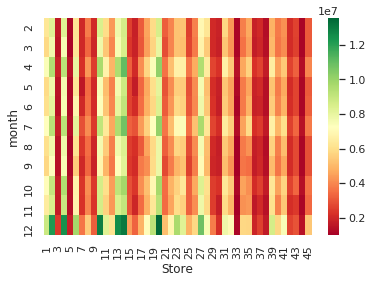

In [35]:
#Stores with high sales
sns.heatmap(x, cmap = 'RdYlGn');

In [40]:
stores = np.random.choice(np.arange(1, 46, 1), 7)
print(stores)
cmap = plt.get_cmap("Set3")
my_colors = cmap(np.arange(0, len(stores), 1))

[28 22 41 27 11  4 36]


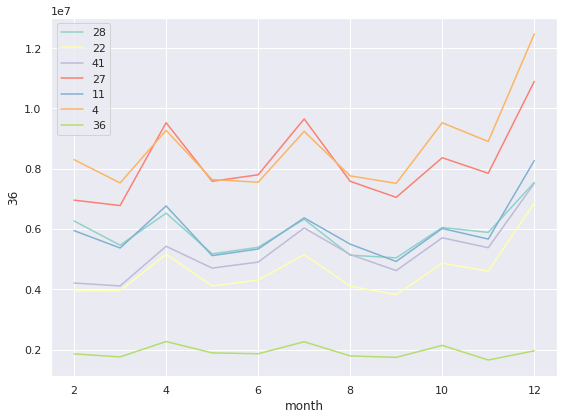

In [41]:
fig = plt.gcf()
fig.set_size_inches(8,6)
for i,store in enumerate(stores):
    sns.lineplot(x.index, x.loc[:, store], color = my_colors[i]);
plt.legend(stores);
plt.tight_layout()

### 2011

In [43]:
x = md.xs(2011, level = 0)

In [44]:
x.style.background_gradient(cmap = 'Reds', axis = 1)

Store,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
month,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,5480050.970000,6949000.950000,1475045.380000,7428613.520000,1101385.700000,5204924.110000,2243460.470000,3287636.780000,1866651.640000,6818438.720000,4661550.100000,3397346.600000,6830701.190000,6920749.250000,1957495.600000,1955191.670000,3333721.560000,3451824.980000,4902533.850000,7270688.300000,2593761.210000,3335860.390000,4333154.250000,4580473.640000,2299697.720000,3377790.850000,6038609.550000,4708717.880000,1738418.560000,1781607.590000,5261839.990000,4159786.440000,979488.910000,3527000.410000,2630152.380000,1566522.750000,2108240.100000,1441138.570000,4819743.690000,3205520.990000,4320671.420000,2239343.310000,2390299.740000,1133348.940000,2595766.210000
2,6399887.570000,8011783.740000,1699036.030000,8701523.580000,1292485.850000,5996637.310000,2237009.210000,3923167.960000,2223984.060000,8158385.480000,5720529.460000,4307178.560000,7628040.020000,7871037.450000,2336972.790000,1912451.470000,3258033.950000,4278936.700000,5555341.850000,8759755.970000,3021142.520000,3842477.600000,4986113.700000,5161694.110000,2460950.600000,3814794.560000,6662626.460000,5788824.430000,2080704.030000,1811650.670000,5887178.910000,4433098.250000,1005667.580000,4003548.220000,3313270.360000,1626477.370000,2157948.380000,1498853.260000,5147822.760000,3693764.890000,4632538.430000,2298339.220000,2506140.530000,1161653.500000,3061868.520000
3,6307375.480000,7529434.800000,1614630.990000,8203913.860000,1229041.930000,6120956.660000,2304418.490000,3561911.220000,2072514.190000,7592005.500000,5335605.230000,4046530.160000,7407382.470000,7784262.930000,2189353.040000,1904986.590000,3155445.260000,3956437.760000,5309557.180000,7890737.230000,3107037.940000,3801895.890000,4695536.280000,4927303.610000,2460458.450000,3646250.380000,6448580.730000,5592046.690000,2001888.600000,1739089.370000,5600889.230000,4377790.550000,1001675.790000,3844979.660000,3243896.850000,1632230.860000,2033791.640000,1464328.180000,5232847.080000,3542971.850000,4644429.720000,2259086.540000,2466532.150000,1145212.170000,2929197.110000
4,7689123.600000,9136076.690000,1884147.520000,10034555.890000,1565270.750000,7561276.620000,2314366.590000,4529354.770000,2692736.650000,9358698.610000,6644689.400000,5005762.880000,9722597.180000,10068949.320000,2953700.890000,2073588.160000,4300747.640000,5024756.640000,6929481.690000,10208105.810000,3829782.070000,5008107.800000,6315886.080000,6253296.340000,3347379.790000,4492878.440000,8609618.190000,6511497.880000,2581496.890000,2177529.140000,6962676.850000,5592702.210000,1277608.540000,4749033.970000,4024732.950000,1944669.760000,2651410.360000,1844187.700000,6958319.790000,4476391.620000,6061682.470000,2756771.400000,3147507.200000,1425285.690000,3828070.540000
5,6128431.800000,7162271.090000,1533308.530000,8068206.560000,1210598.710000,5864600.160000,1702994.370000,3531210.050000,2156478.040000,7018273.820000,5065756.320000,3886655.480000,7672497.440000,8140592.270000,2491140.720000,1714328.040000,3489257.760000,4118424.920000,5624884.420000,8025436.200000,2962361.400000,4025510.970000,5314398.730000,5197015.930000,2740574.970000,3900845.280000,7066579.010000,5080532.970000,2127591.700000,1727812.130000,5526512.660000,4640488.560000,1015136.170000,3818416.930000,3288884.290000,1513556.690000,2100036.100000,1511781.300000,5475974.990000,3800101.210000,5037829.310000,2243217.340000,2560344.460000,1218451.700000,3148856.660000
6,6194971.740000,7607607.160000,1575090.640000,8288884.070000,1241861.520000,6469666.170000,2414430.640000,3613461.220000,2234497.680000,7062021.880000,5250358.330000,3951054.310000,8029007.420000,8363952.330000,2634599.800000,2282683.630000,3591617.590000,4324456.240000,5784578.700000,8333326.320000,3162795.880000,4241077.220000,5913747.040000,5553889.430000,2894454.900000,4127634.470000,7497817.960000,5221064.910000,2238965.

## Month wise trend across depts

In [90]:
df_mon = df.loc[:, ["Store", "month", "year", "Weekly_Sales"]]

In [95]:
stores = np.random.choice(np.arange(1, 46, 1), 3)

In [107]:
stores = [2,4,10,13,14,20]

In [108]:
d = df_mon[df_mon.Store.isin(stores)]

In [120]:
d.head()

,Store,month,year,Weekly_Sales
10244,2,2,2010,35034.06
10245,2,2,2010,60483.70
10246,2,2,2010,58221.52
10247,2,2,2010,25962.32
10248,2,3,2010,27372.05


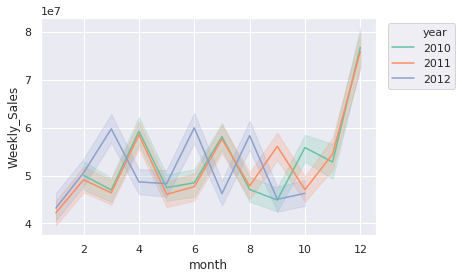

In [119]:
sns.lineplot("month", "Weekly_Sales", data = d, hue = "year", palette = "Set2", estimator = np.sum);
plt.legend(bbox_to_anchor = (1.02, 1));

In [30]:
tbd.index[0]

Timestamp('2010-02-05 00:00:00')

In [31]:
df_2010 = tbd.loc[tbd.index.year == 2010]

In [32]:
df_2010.shape

(48, 45)

In [33]:
df_2010.index = df_2010.index.week

In [34]:
df_2010.index[0]

5

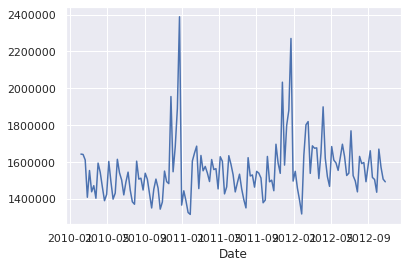